#### A 1D simulation designed to measure the long-term behaviour of fitness in range expansions 


In [1]:
include("../resk.jl")
include("../reskplots.jl")

RESK successfully loaded.
RESKPlots successfully loaded.


Check if a shorter version with the same parameters works:

In [2]:
Random.seed!(1234)
aa = rangeexp_1d_inf(0,2500,1;x_max_burnin=5,x_max_exp=500,data_to_generate="FP",k_capacity=100,r_prolif_rate=2,weightfitn=false,condsel=true,oneside=true,premutate=true,mut_rate=0.05,migr_rate=0.05,s_sel_coef=0.005)

Dict{String, Any} with 5 entries:
  "pops"  => Float32[93.0 92.0 … 104.0 108.0; 117.0 111.0 … 97.0 106.0; … ; NaN…
  "del"   => NaN
  "fitn"  => Float32[1.0 0.999893 … 2.32445 2.33059; 1.0 0.999492 … 2.30822 2.3…
  "stats" => Dict{String, Any}("wlddim"=>1, "r_prolif_rate"=>2, "max_burnin"=>(…
  "ben"   => NaN

In [5]:
aa["pops"][:,2019,1]

500-element Vector{Float32}:
 105.0
 108.0
 105.0
  97.0
 111.0
  91.0
 109.0
 110.0
  88.0
  84.0
   ⋮
  81.0
  99.0
  88.0
 101.0
 109.0
 111.0
  85.0
 102.0
 101.0

In [4]:
function timeseries_mean(ts, n_gens)
    return [mean(ts[i,:]) for i in 1:n_gens]
end

function analyse(condsel)
    nm = condsel ? "condsel true" : "condsel false"
    re = rangeexp_1d_inf(1,1200,5;x_max_burnin=5,x_max_exp=500,data_to_generate="F",k_capacity=100,r_prolif_rate=2,weightfitn=false,condsel=condsel,name=nm,mut_rate=0.05,migr_rate=0.05,s_sel_coef=0.005)
    N_GENS = re["stats"]["n_gens"]

    re_fitn_frontav = average_front(re,"fitn";oneside=true)
    re_fitn_frontav_mean = timeseries_mean(re_fitn_frontav, N_GENS)
    re_fitnN = norm_onset_mean(re, "fitn")
    re_fitnN_frontav = average_front(re_fitnN, N_GENS, re["stats"]["max"][1]; oneside=true)
    re_fitnN_frontav_mean = timeseries_mean(re_fitnN_frontav, N_GENS)

    return re, re_fitn_frontav_mean, re_fitnN_frontav_mean
end

function heatcheck(a)
    re_heatmap(a, "fitn", a["stats"]["n_gens"]-150, a["stats"]["n_gens"])
end

function plotcheck(a)
    Plots.plot(a[2],xlabel="Generation",label=a[1]["stats"]["name"])
end
function plotcheck!(a)
    Plots.plot!(a[2],xlabel="Generation",label=a[1]["stats"]["name"])
end

plotcheck! (generic function with 1 method)

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_xmhKfELEls.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_xmhKfELEls.gif")
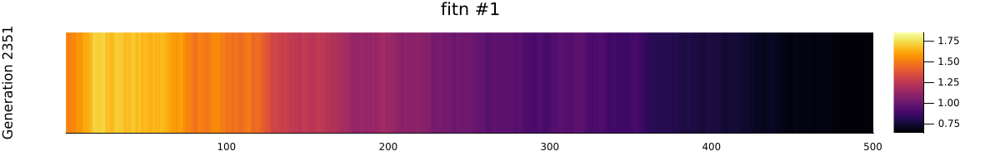

In [9]:
re_heatmap(aa, "fitn", aa["stats"]["n_gens"]-150, aa["stats"]["n_gens"])

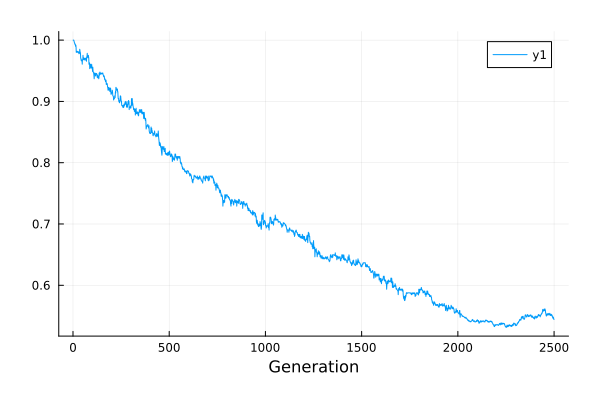

In [4]:
function timeseries_mean(ts, n_gens)
    return [mean(ts[i,:]) for i in 1:n_gens]
end

re = aa
N_GENS = re["stats"]["n_gens"]
re_fitn_frontav = average_front(re,"fitn";oneside=true)
re_fitn_frontav_mean = timeseries_mean(re_fitn_frontav, N_GENS)
re_fitnN = norm_onset_mean(re, "fitn")
re_fitnN_frontav = average_front(re_fitnN, N_GENS, re["stats"]["max"][1]; oneside=true)
re_fitnN_frontav_mean = timeseries_mean(re_fitnN_frontav, N_GENS)
Plots.plot(re_fitnN_frontav_mean,xlabel="Generation")

In [ ]:
Random.seed!(1234)
bb = rangeexp_1d_inf(1,200,1;x_max_burnin=5,x_max_exp=500,data_to_generate="FP",k_capacity=100,r_prolif_rate=2,weightfitn=false,condsel=true,name="2",mut_rate=0.05,migr_rate=0.05,s_sel_coef=0.005)

In [3]:
aa["stats"]

Dict{String, Any} with 18 entries:
  "wlddim"            => 1
  "r_prolif_rate"     => 2
  "max_burnin"        => (5,)
  "name"              => "1"
  "startfill"         => UnitRange{Int64}[1:5]
  "s_sel_coef"        => 0.009
  "n_gens_burnin"     => 5
  "k_capacity"        => 100
  "prop_of_del_muts"  => 0.9
  "migr_rate"         => 0.05
  "max"               => (10,)
  "n_segr_regions"    => 20
  "n_gens"            => 5
  "migr_mode"         => "ort"
  "n_gens_exp"        => 0
  "mut_rate"          => 12
  "max_exp"           => (10,)
  "n_demes_startfill" => 5

In [20]:
aa["fitn"]

500×201×1 Array{Float32, 3}:
[:, :, 1] =
   1.0    1.00005     0.999831  …    0.988876    0.98873     0.987096
   1.0    0.999545    0.999358       0.99109     0.990783    0.991313
   1.0    0.999802    0.999613       0.98985     0.990439    0.992244
   1.0    0.999911    0.999745       0.996143    0.997025    0.996408
   1.0    0.999811    0.999787       0.995514    0.994881    0.995446
 NaN    NaN           1.0       …    0.995098    0.994588    0.996362
 NaN    NaN         NaN              0.994435    0.992851    0.991983
 NaN    NaN         NaN              0.992116    0.991603    0.992392
 NaN    NaN         NaN              0.989953    0.99059     0.990901
 NaN    NaN         NaN              0.987854    0.988624    0.986509
   ⋮                            ⋱                            ⋮
 NaN    NaN         NaN            NaN         NaN         NaN
 NaN    NaN         NaN            NaN         NaN         NaN
 NaN    NaN         NaN            NaN         NaN         NaN
 NaN   

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_1YHG9ahcHW.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_1YHG9ahcHW.gif")
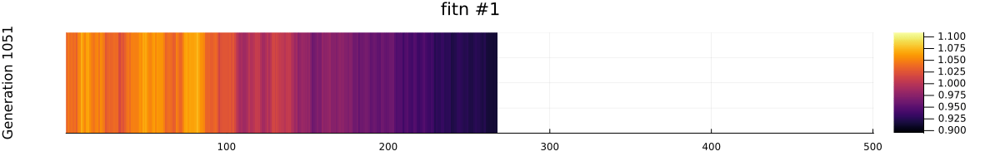

In [3]:
a = analyse(true)
b = analyse(false)
heatcheck(a[1])

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_R2pmXi5YPk.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_R2pmXi5YPk.gif")
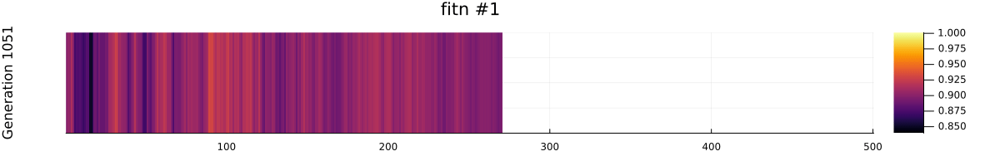

In [4]:
heatcheck(b[1])

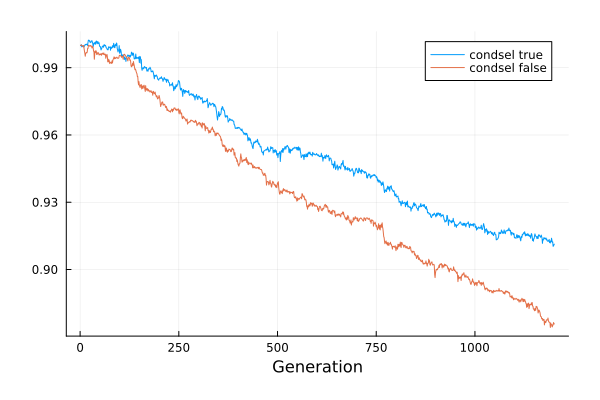

In [5]:
plotcheck(a,b)

In [9]:
heh_raw = Array{Float32}(undef,500,201,0)
for i in 1:1
    heh_raw = cat(heh_raw,deserialize("../../study/data/1d/1d_test_$i-meanf.dat");dims=3)
end
toNaN(x) = x < 0 ? NaN : x
#to3d(A) = reshape(A, size(A, 1), size(A, 2), 1)
heh_fitn = toNaN.(heh_raw) #|> to3d

500×201×1 Array{AbstractFloat, 3}:
[:, :, 1] =
   1.0    0.999607    0.999409  …    0.972879    0.970534    0.968639
   1.0    0.99969     0.999439       0.964188    0.963047    0.964092
   1.0    0.999775    0.999278       0.950224    0.947739    0.947655
   1.0    0.999526    0.999421       0.944984    0.943007    0.941051
   1.0    0.999536    0.999051       0.957081    0.956993    0.957848
 NaN    NaN         NaN         …    0.956546    0.956887    0.9543
 NaN    NaN         NaN              0.953716    0.950045    0.953913
 NaN    NaN         NaN              0.957585    0.955222    0.956635
 NaN    NaN         NaN              0.946207    0.94788     0.949195
 NaN    NaN         NaN              0.957248    0.954674    0.953941
   ⋮                            ⋱                            ⋮
 NaN    NaN         NaN            NaN         NaN         NaN
 NaN    NaN         NaN            NaN         NaN         NaN
 NaN    NaN         NaN            NaN         NaN         NaN
 Na

In [10]:
heh_fitn

500×201×1 Array{AbstractFloat, 3}:
[:, :, 1] =
   1.0    0.999607    0.999409  …    0.972879    0.970534    0.968639
   1.0    0.99969     0.999439       0.964188    0.963047    0.964092
   1.0    0.999775    0.999278       0.950224    0.947739    0.947655
   1.0    0.999526    0.999421       0.944984    0.943007    0.941051
   1.0    0.999536    0.999051       0.957081    0.956993    0.957848
 NaN    NaN         NaN         …    0.956546    0.956887    0.9543
 NaN    NaN         NaN              0.953716    0.950045    0.953913
 NaN    NaN         NaN              0.957585    0.955222    0.956635
 NaN    NaN         NaN              0.946207    0.94788     0.949195
 NaN    NaN         NaN              0.957248    0.954674    0.953941
   ⋮                            ⋱                            ⋮
 NaN    NaN         NaN            NaN         NaN         NaN
 NaN    NaN         NaN            NaN         NaN         NaN
 NaN    NaN         NaN            NaN         NaN         NaN
 Na

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_sBazI5mFC5.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_sBazI5mFC5.gif")
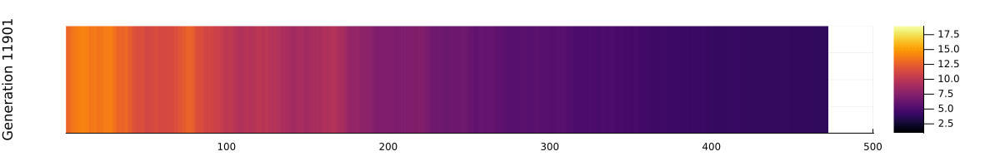

In [26]:
re_heatmap(heh_fitn[:,:,1],11900,12000)

In [39]:
N_GENS = 12000
N_GENS_BURNIN = 10000
X_MAX = 500
heh_fitn_frontav = average_front(heh_fitn,N_GENS,X_MAX;oneside=true)
heh_fitn_frontav_mean = timeseries_mean(heh_fitn_frontav, N_GENS)
heh_fitnN = norm_onset_mean(heh_fitn, N_GENS_BURNIN)
heh_fitnN_frontav = average_front(heh_fitnN, N_GENS, X_MAX; oneside=true)
heh_fitnN_frontav_mean = timeseries_mean(heh_fitnN_frontav, N_GENS)

12000-element Vector{Float32}:
 1.0
 0.99976325
 0.99936044
 0.99860466
 0.9980856
 0.9977799
 0.9973043
 0.99707055
 0.99628484
 0.9961932
 ⋮
 0.521328
 0.52115107
 0.52199054
 0.52104914
 0.5213679
 0.52153873
 0.5200221
 0.520241
 0.5205926

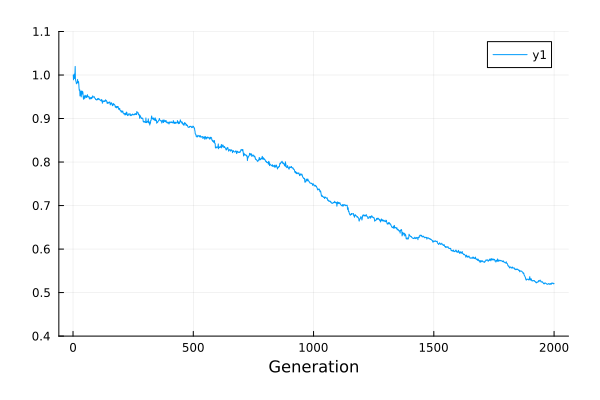

In [41]:
Plots.plot(heh_fitnN_frontav_mean[10001:12000],xlabel="Generation",ylims=(0.4,1.1))

---

In [ ]:
aa = rangeexp_strip_inf(0,120,10; x_max_burnin=5, x_max_exp=250, y_max=10, data_to_generate="FP",capacity=100,prolif_rate=2,weightfitn=false,condsel=true,oneside=true,premutate=true,bottleneck=NaN,mut_rate=0.05,migr_rate=0.05,sel_coef=0.005)

In [ ]:
aa["fitn"][:,:,20,1]

---

In [ ]:
aa = rangeexp_disk_inf(0,4,1; r_max_burnin=3, r_max_exp=100, data_to_generate="FP",capacity=100,prolif_rate=2,weightfitn=false,condsel=true,premutate=true,oneside=true,bottleneck=NaN,mut_rate=0.1,migr_rate=0.05,sel_coef=0.005,
    startfill_range=[(100+1-3):(100+1+3),(100+1-3):(100+1+3)])

In [ ]:
Plots.heatmap(aa["fitn"][95:105,95:105,1,1])

In [ ]:
aa["fitn"][95:105,95:105,2,1]

---

In [ ]:
Random.seed!(1234)
aa = rangeexp_cylinder_inf(0,2,1; r_max_burnin=10, r_max_exp=10, z_max_burnin=5, z_max_exp=250, data_to_generate="FP",capacity=100,prolif_rate=2,weightfitn=false,condsel=true,premutate=true,
    oneside=true, bottleneck=NaN, mut_rate=0.1, migr_rate=0.05, sel_coef=0.005, startfill_range=[1:21,1:21,1:5])

In [ ]:
plt = Plots.heatmap(aa["fitn"][:,:,3,2,1],xticks=(1:1:21),yticks=(1:1:21))

---

In [ ]:
test = rangeexp_cylinder_inf(0,50,1; r_max_burnin=3, r_max_exp=50, data_to_generate="F", capacity=100,
    prolif_rate=2, weightfitn=false, condsel=true, premutate=true, fixed_mate=true,
    bottleneck=NaN, mut_rate=0.05, migr_rate=0.05, sel_coef=0.005, startfill_range=[(50+1-3):(50+1+3),(50+1-3):(50+1+3),(50+1-3):(50+1+3)])

In [ ]:
re_heatstack(test, "fitn", test["stats"]["n_gens"]-49, test["stats"]["n_gens"])